In [103]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns

sns.set(style="whitegrid", font_scale=1.75)

import scipy.special as sp
import sklearn.datasets as datasets
import sklearn.linear_model as lm
import sklearn.ensemble as en
import sklearn.tree as tree
import econml
import importlib

#### data generation packages
import strawman_edge
import strawman_center
import all_linear

#### main packages
import characterize
import estimate_atte as est
import learn_w as learn
import black

importlib.reload(est)
importlib.reload(learn)

import warnings

warnings.filterwarnings("ignore")

%load_ext jupyter_black

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


# Box DGP

In [145]:
df, Y = strawman_edge.get_data(n=10000, seed=0)
outcome = "Yobs"
treatment = "T"
sample = "S"
TE = Y["Y1"] - Y["Y0"]
df_true = df.copy(deep=True)
df_true["TE"] = TE

In [114]:
importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.kmeans_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
)

# D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w", data=D_labels, ax=ax)
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

brute_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.linear_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=42
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

linear_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.tree_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=0
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

tree_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=1,
    num_trees=3000,
    vote_threshold=2 / 5,
)

# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w_opt", data=D_rash, ax=ax)
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_rash.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")
df_refined = df.join(D_w_true[["w"]])
df_refined = df_refined.loc[df_refined["w"] == 1]

np.random.seed(42)
df_v, pi, pi_m, e_m, testing_data = learn.estimate_dml(
    data=df_refined, outcome="Yobs", treatment="T", sample="S", crossfit=5
)

forest_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                df_v["te"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

print(
    pd.concat([forest_box_r, tree_box_r, linear_box_r, brute_box_r], axis=1).to_latex()
)

Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
(1.6205510393057676, 0.7625384755507761, 2.9358759380203168, 0.9108621003879755)
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.9108630121099217
            Iterations: 20
            Function evaluations: 221
            Gradient evaluations: 20
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: 2.9359
leaf    0.500000
X0      0.188956
X1      0.182074
X2      0.011202
X3      0.040775
X4      0.021581
X5      0.012695
X6      0.001000
X7      0.029918
X8      0.006273
X9      0.005525
dtype: float64
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
\begin{tabular}{lrrrrrrrr}
\toprule
{} &       Pre &      Post &       Pre &      Post &       Pre &      Post &       Pre &      Post \\
\midrule
Bias  &  0.220852 & -0.001609 & -0.027269 & -1.087724 &  0.220852 &  0.220852 &  0.220852 &  0.091317 \\
Stdev &  0.910862 &  0.323600 &  0.887443 &  0.408939 &  0.9108

Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: 2.9359
leaf    0.500000
X0      0.188956
X1      0.182074
X2      0.011202
X3      0.040775
X4      0.021581
X5      0.012695
X6      0.001000
X7      0.029918
X8      0.006273
X9      0.005525
dtype: float64


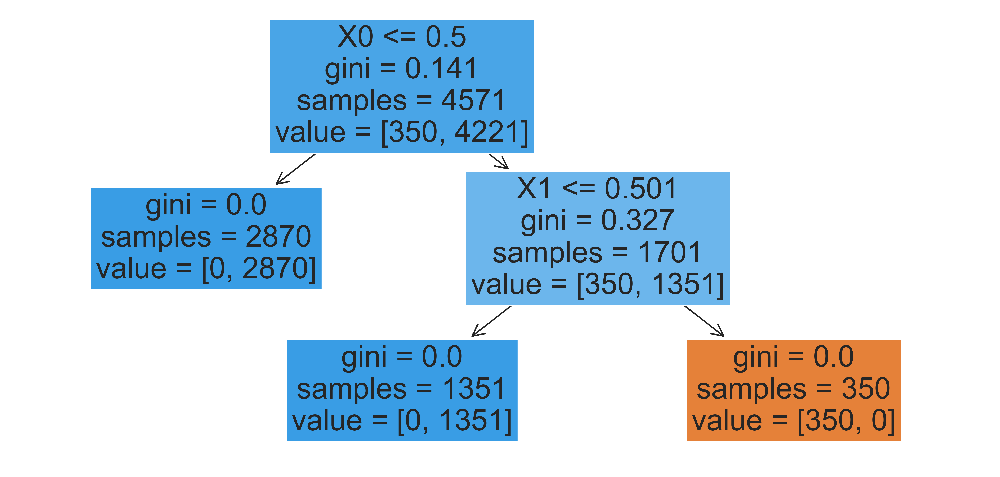

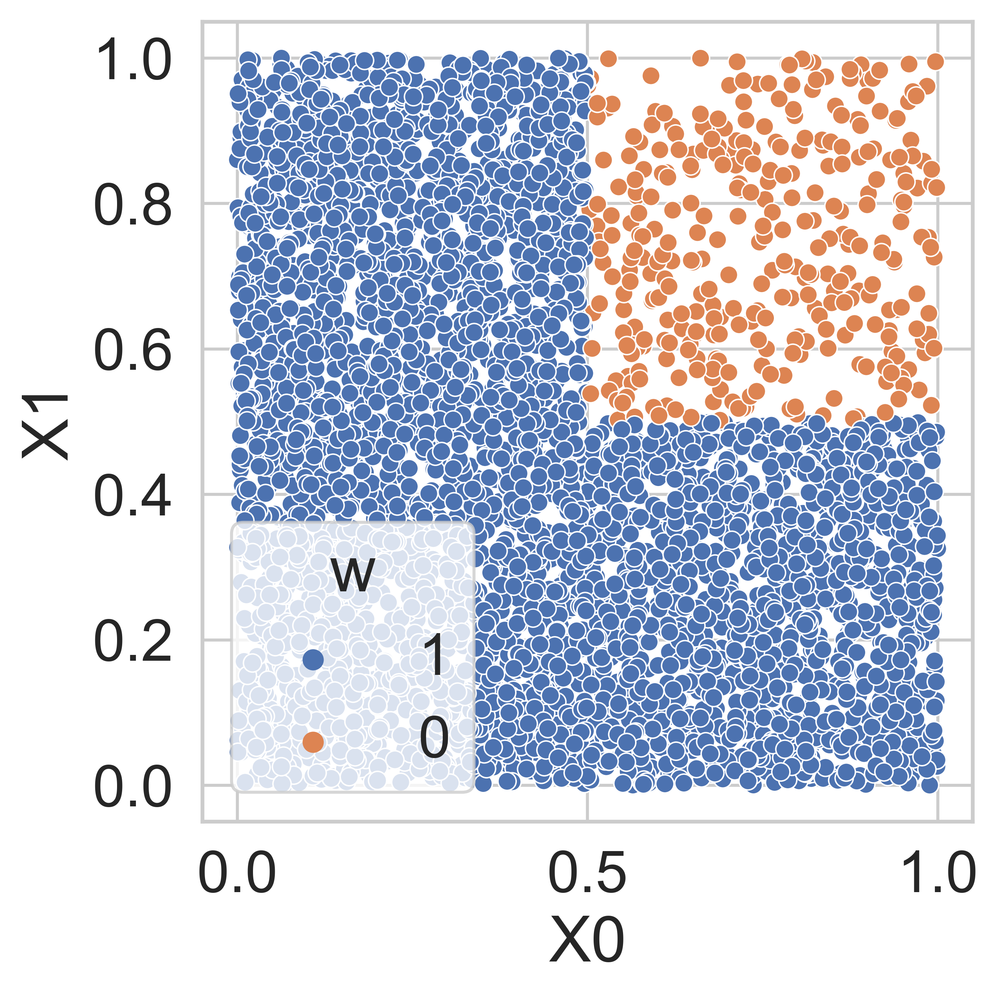

In [146]:
importlib.reload(learn)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=1,
    num_trees=3000,
    vote_threshold=2 / 5,
)
baseline_loss = np.sqrt(np.sum(D_forest["vsq"]) / ((np.sum((1 - D_forest["S"])) ** 2)))

fig, ax = plt.subplots(figsize=(10, 5), sharex=True, sharey=True, dpi=600)
tree.plot_tree(
    f,
    filled=True,
    feature_names=df.drop(columns=[outcome, treatment, sample]).columns,
    ax=ax,
)
plt.tight_layout()
fig.savefig("explain_box.pdf", format="pdf", dpi=600)

fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
sns.scatterplot(x="X0", y="X1", hue="w_opt", data=D_rash, ax=ax, hue_order=[1, 0])
plt.legend(title="w", loc="lower left")
plt.tight_layout()
fig.savefig("forest_box.pdf", format="pdf", dpi=600)

# Community DGP

In [143]:
importlib.reload(strawman_center)
df, Y = strawman_center.get_data(n=5000, seed=0)
outcome = "Yobs"
treatment = "T"
sample = "S"
TE = Y["Y1"] - Y["Y0"]
df_true = df.copy(deep=True)
df_true["TE"] = TE

In [123]:
importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.kmeans_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
)

# D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w", data=D_labels, ax=ax)
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

brute_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.linear_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=42
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

linear_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.tree_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=0
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

tree_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=1,
    num_trees=3000,
    vote_threshold=1 / 2,
    top_k_trees=True,
    k=10,
)

# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w_opt", data=D_rash, ax=ax)
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_rash.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")
df_refined = df.join(D_w_true[["w"]])
df_refined = df_refined.loc[df_refined["w"] == 1]

np.random.seed(42)
df_v, pi, pi_m, e_m, testing_data = learn.estimate_dml(
    data=df_refined, outcome="Yobs", treatment="T", sample="S", crossfit=5
)

forest_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                df_v["te"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

print(
    pd.concat([forest_box_r, tree_box_r, linear_box_r, brute_box_r], axis=1).to_latex()
)

Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
(6.392310002966536, 0.7695147118716399, 19.62995859131056, 3.0730515283059914)
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Optimization terminated successfully    (Exit mode 0)
            Current function value: 2.99527648782137
            Iterations: 42
            Function evaluations: 140
            Gradient evaluations: 42
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: 19.6300
leaf    0.500000
X0      0.389845
X1      0.110155
dtype: float64
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
\begin{tabular}{lrrrrrrrr}
\toprule
{} &       Pre &      Post &       Pre &      Post &       Pre &      Post &       Pre &      Post \\
\midrule
Bias  & -5.129456 &  1.498371 & -3.556132 & -5.581054 & -5.129456 & -3.409978 & -5.129456 & -6.802110 \\
Stdev &  3.073052 &  0.449605 &  3.758598 &  0.985369 &  3.073052 &  2.995268 &  3.073052 &  0.769515 \\
\bottomrule
\end{tabular}



Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: 19.6300
leaf    0.500000
X0      0.389845
X1      0.110155
dtype: float64


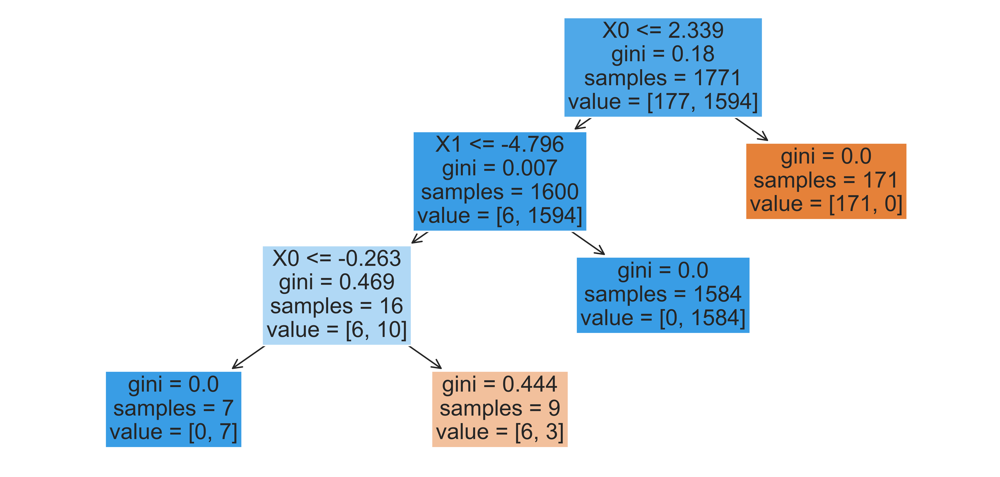

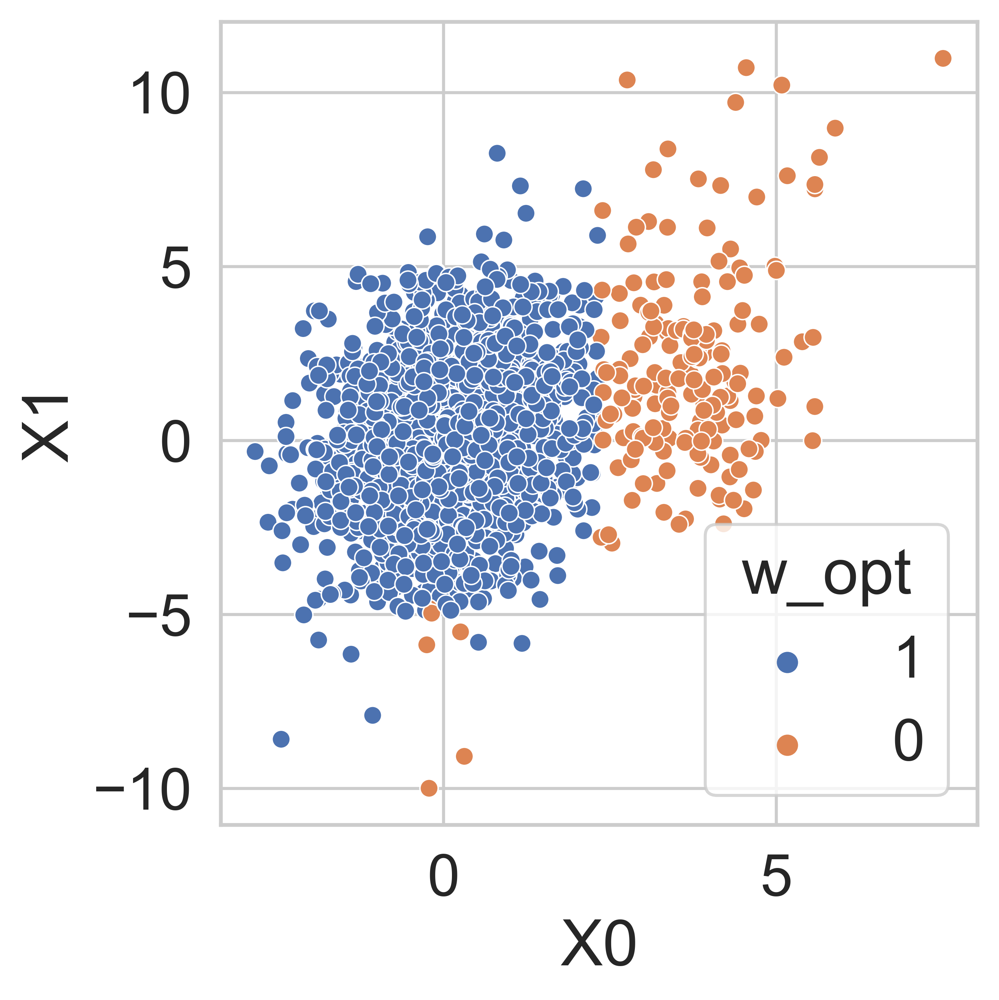

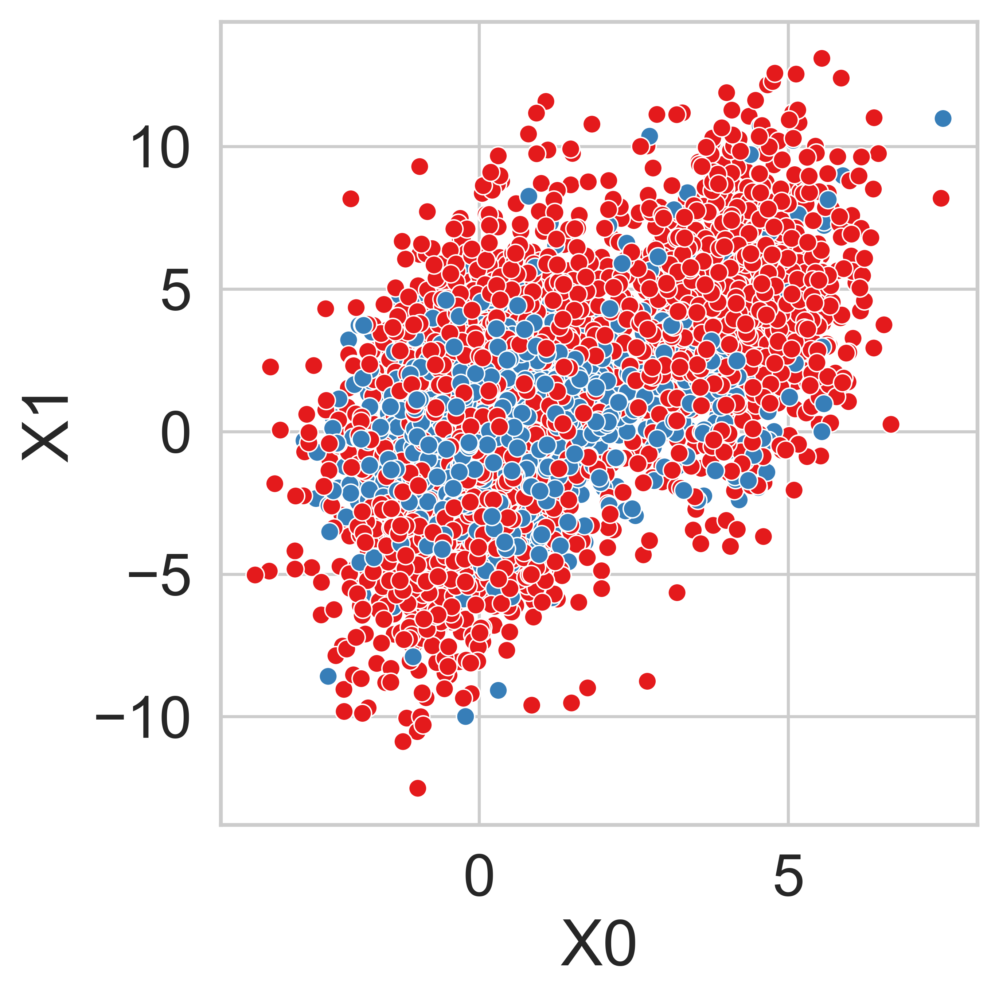

In [144]:
importlib.reload(learn)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=1,
    num_trees=3000,
    vote_threshold=1 / 2,
)
baseline_loss = np.sqrt(np.sum(D_forest["vsq"]) / ((np.sum((1 - D_forest["S"])) ** 2)))

fig, ax = plt.subplots(figsize=(10, 5), sharex=True, sharey=True, dpi=600)
tree.plot_tree(
    f,
    filled=True,
    feature_names=df.drop(columns=[outcome, treatment, sample]).columns,
    ax=ax,
)
plt.tight_layout()
fig.savefig("explain_community.pdf", format="pdf", dpi=600)

fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="S", data=df, ax=ax, palette="Set1", legend=False)
sns.scatterplot(x="X0", y="X1", hue="w_opt", data=D_rash, ax=ax, hue_order=[1, 0])
# plt.legend(title="w")
plt.tight_layout()
fig.savefig("forest_community.pdf", format="pdf", dpi=600)

fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
sns.scatterplot(x="X0", y="X1", hue="S", data=df, ax=ax, palette="Set1", legend=False)
plt.tight_layout()

# Linear DGP

In [131]:
importlib.reload(all_linear)
df, Y, coef = all_linear.get_data(n=5000, seed=1)
outcome = "Yobs"
treatment = "T"
sample = "S"
TE = Y["Y1"] - Y["Y0"]
df_true = df.copy(deep=True)
df_true["TE"] = TE

(array([-4.18201994,  1.42942861, -0.95389448, ..., -0.6601245 ,
        0.00616464, -2.52296175]), array([0.01503804, 0.80681227, 0.27810228, ..., 0.34071164, 0.50154116,
       0.07426407]))


In [139]:
importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.kmeans_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
)

# D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w", data=D_labels, ax=ax)
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

brute_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.linear_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=42
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

linear_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_labels, f, testing_data = learn.tree_opt(
    data=df, outcome=outcome, treatment=treatment, sample=sample, seed=0
)

D_labels["w"] = D_labels["w"].astype(int)
# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(
#     x="X0", y="X1", hue="w", data=D_labels, ax=ax, hue_order={0: "C1", 1: "C2"}
# )
# plt.legend(title="w")
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_labels.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")

tree_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                D_w_true.loc[(D_w_true["S_true"] == 1) * (D_w_true["w_true"] == 1)][
                    "v"
                ].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w_true"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

importlib.reload(learn)
np.random.seed(42)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=0.5,
    num_trees=2000,
    vote_threshold=2 / 3,
    top_k_trees=True,
    k=20,
)

# fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
# sns.scatterplot(x="X0", y="X1", hue="w_opt", data=D_rash, ax=ax)
# # plt.xlim(-0.01, 1.25)
# # plt.ylim(-0.01, 1.25)
# plt.legend(ncols=2, loc="lower left")
# plt.tight_layout()

df_true["w"] = f.predict(df_true[[col for col in df_true.columns if "X" in col]])
D_w_true = D_rash.join(df_true[["TE", "S", "w"]], rsuffix="_true", how="outer")
df_refined = df.join(D_w_true[["w"]])
df_refined = df_refined.loc[df_refined["w"] == 1]

np.random.seed(42)
df_v, pi, pi_m, e_m, testing_data = learn.estimate_dml(
    data=df_refined, outcome="Yobs", treatment="T", sample="S", crossfit=5
)

forest_box_r = pd.DataFrame(
    [
        [
            (
                D_w_true.loc[(D_w_true["S_true"] == 1)]["v"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0)]["TE"].mean()
            ),
            (
                df_v["te"].mean()
                - D_w_true.loc[(D_w_true["S_true"] == 0) * (D_w_true["w"] == 1)][
                    "TE"
                ].mean()
            ),
        ],
        [
            np.sqrt(
                D_w_true.loc[(D_w_true["S"] == 1)]["vsq"].sum()
                / (D_w_true.loc[(D_w_true["S"] == 1)].shape[0]) ** 2
            ),
            (
                np.sqrt(
                    D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)][
                        "vsq"
                    ].sum()
                    / (
                        D_w_true.loc[(D_w_true["S"] == 1) * (D_w_true["w"] == 1)].shape[
                            0
                        ]
                    )
                    ** 2
                )
            ),
        ],
    ],
    index=["Bias", "Stdev"],
    columns=["Pre", "Post"],
)

print(
    pd.concat([forest_box_r, tree_box_r, linear_box_r, brute_box_r], axis=1).to_latex()
)

Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
(-0.48363951845913744, 0.17008738675284862, -0.01133992553375758, 0.1917533931148697)
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Optimization terminated successfully    (Exit mode 0)
            Current function value: 0.17316837648101244
            Iterations: 25
            Function evaluations: 526
            Gradient evaluations: 25
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: -0.0113
leaf    0.333333
X0      0.030301
X1      0.063617
X2      0.026517
X3      0.028623
X4      0.050808
X5      0.023012
X6      0.018378
X7      0.028810
X8      0.080691
X9      0.092106
X10     0.008039
X11     0.038048
X12     0.011900
X13     0.005702
X14     0.006842
X15     0.020275
X16     0.040761
X17     0.017073
X18     0.031870
X19     0.043294
dtype: float64
Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
\begin{tabular}{lrrrrrrrr}
\toprule
{} &       Pre &      Post &       Pre &      Post &       Pre &      Post &       Pre &      Post \\


Fold 0
Fold 1
Fold 2
Fold 3
Fold 4
ATE Est: -0.0113
leaf    0.500000
X0      0.022726
X1      0.047713
X2      0.019887
X3      0.021468
X4      0.038106
X5      0.017259
X6      0.013783
X7      0.021608
X8      0.060518
X9      0.069079
X10     0.006029
X11     0.028536
X12     0.008925
X13     0.004276
X14     0.005131
X15     0.015206
X16     0.030570
X17     0.012805
X18     0.023903
X19     0.032470
dtype: float64


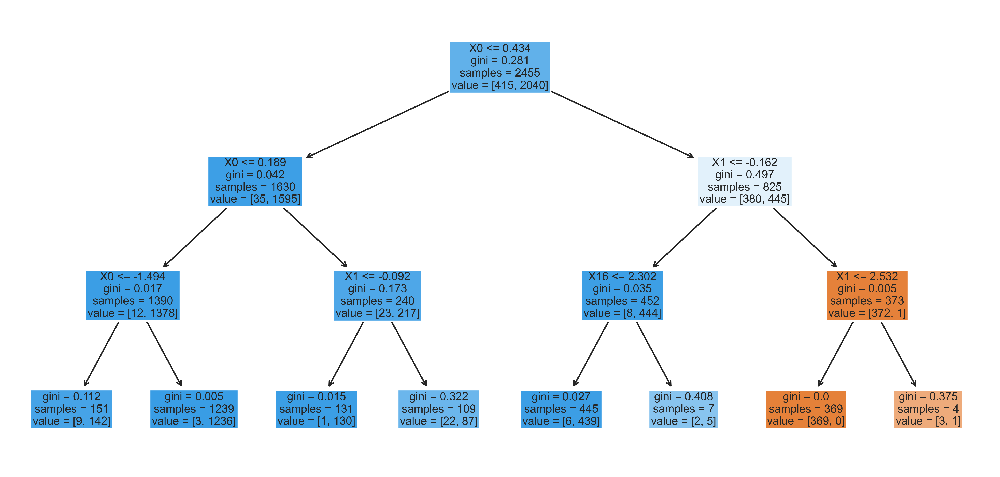

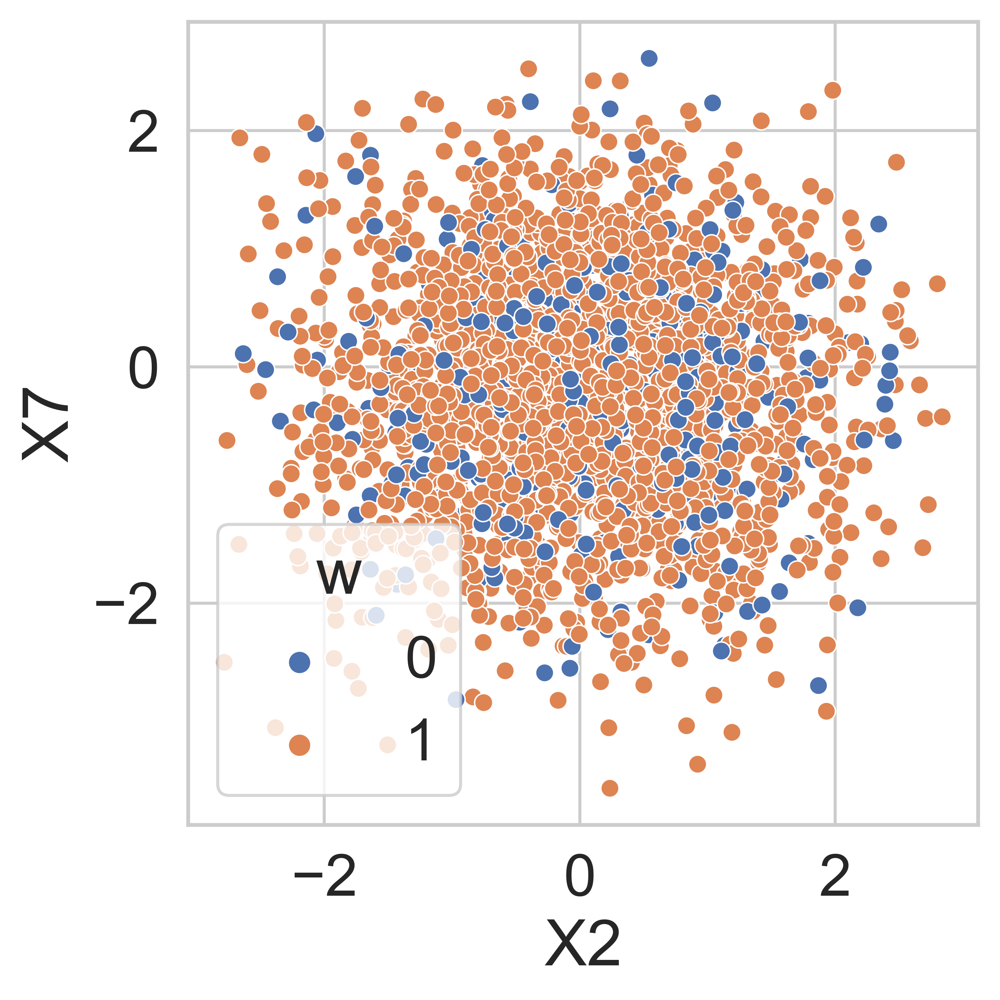

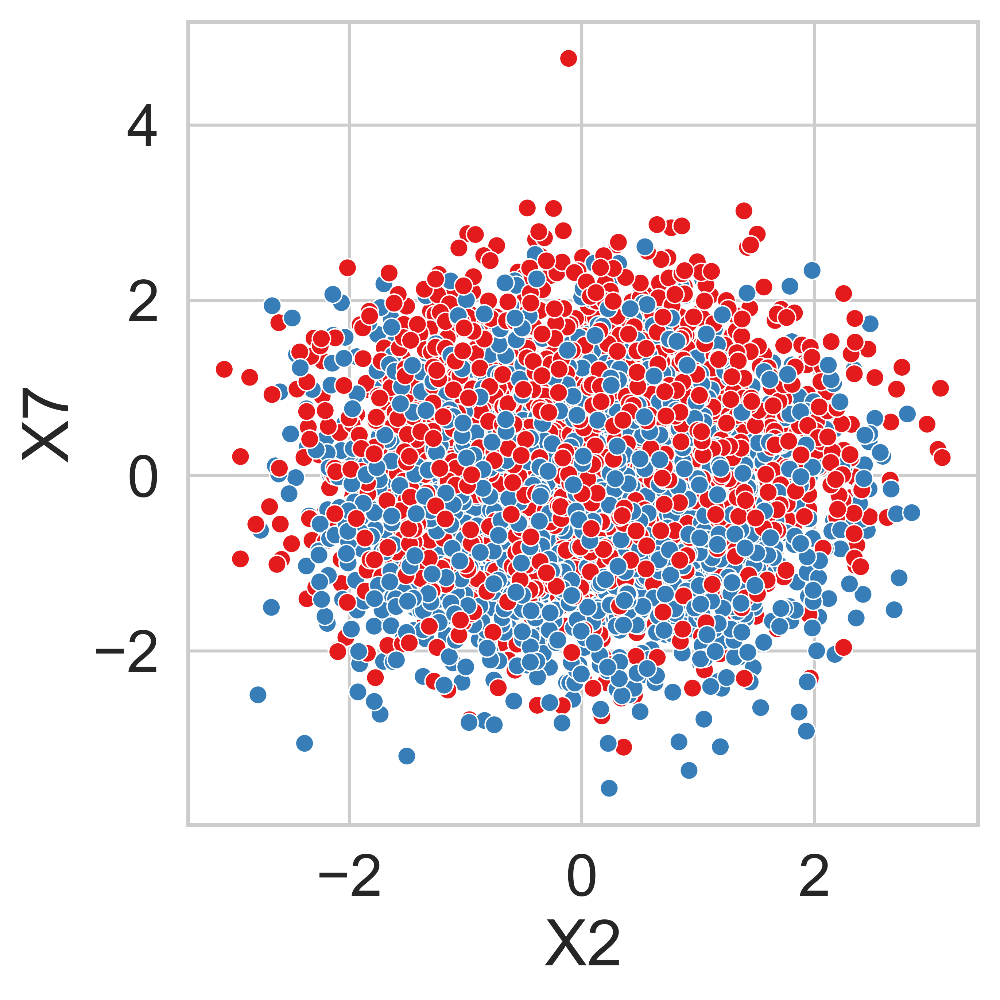

In [141]:
importlib.reload(learn)
D_rash, D_forest, w_forest, rashomon_set, f, testing_data = learn.forest_opt(
    data=df,
    outcome=outcome,
    treatment=treatment,
    sample=sample,
    leaf_proba=1,
    num_trees=3000,
    vote_threshold=4 / 5,
    top_k_trees=True,
    k=10,
)
baseline_loss = np.sqrt(np.sum(D_forest["vsq"]) / ((np.sum((1 - D_forest["S"])) ** 2)))

fig, ax = plt.subplots(figsize=(10, 5), sharex=True, sharey=True, dpi=600)
tree.plot_tree(
    f,
    filled=True,
    feature_names=df.drop(columns=[outcome, treatment, sample]).columns,
    ax=ax,
)
plt.tight_layout()
fig.savefig("explain_linear.pdf", format="pdf", dpi=600)

fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
sns.scatterplot(x="X2", y="X7", hue="w_opt", data=D_rash, ax=ax, hue_order=[1, 0])
plt.legend(title="w")
plt.tight_layout()
fig.savefig("forest_linear.pdf", format="pdf", dpi=600)

fig, ax = plt.subplots(figsize=(5, 5), sharex=True, sharey=True, dpi=600)
sns.scatterplot(
    x="X2",
    y="X7",
    hue="S",
    data=df,
    ax=ax,
    palette="Set1",
    legend=False,
)
plt.tight_layout()